In [1]:
import numpy as np
import pandas as pd

In [2]:
pwd

'C:\\Users\\Syed Hassaan Haider'

In [3]:
df_train = pd.read_csv("train.csv")

In [4]:
df_train.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In the above output, we can see that each pixel is representing a column

In [6]:
df_train.shape

(42000, 785)

We have 42000 images stored in a tabular format

In [9]:
df_train.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
23300,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


The label tells us the number present on the image. In the above sample, label 2 shows the number 2 image.

In [10]:
import matplotlib.pyplot as plt

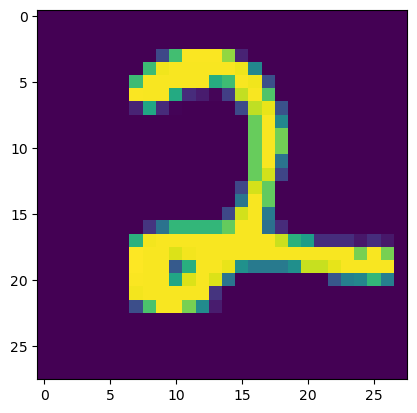

In [11]:
plt.imshow(df_train.iloc[23300,1:].values.reshape(28,28))
#Since its a series we passed the values attribute

In [16]:
df_train.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
34424,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


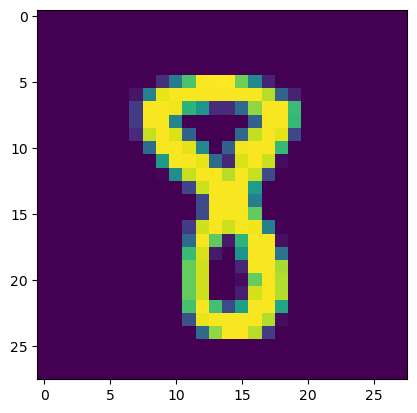

In [17]:
plt.imshow(df_train.iloc[34424,1:].values.reshape(28,28))

We have converted 2D to 1D

In [19]:
X = df_train.iloc[:,1:] #extracting all rows and columns 1 onwards
y = df_train.iloc[:,0] #extracting all rows and zeroth column

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)

In [21]:
X_train.shape

(33600, 784)

**KNN**

Using KNN, we will be calculating the distance of one particular image with all the other images, to find out which images are similar to our given images. Then, we will be finding out the label of all the similar images.
In other words, in a 784 dimensional space, we are calculating the distance of one given point with all other 33000 points. and afterthat, by sorting, we are finding the nearest neighbor of that point, to find the label of that point.

In [24]:
from sklearn.neighbors import KNeighborsClassifier

In [25]:
#Creating the object of the classifier
KNN = KNeighborsClassifier()

In [26]:
#Fitting the classifier to training and test set
KNN.fit(X_train,y_train)

KNeighborsClassifier()

In [27]:
#Calculating how long the following code takes to run
import time
start = time.time()
y_pred = KNN.predict(X_test)
print(time.time()-start)

11.90798020362854


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


It took 11 seconds to run

In [28]:
from sklearn.metrics import accuracy_score

In [36]:
accuracy_score(y_test,y_pred)

0.9648809523809524

A 96.5% accuracy is a very high accuracy. This means 96.5% of our data is accurately predicted by our model. However, this score is not the only metric for evaluation of model performance. Hence, the following code gives more detailed analysis

In [44]:
from sklearn.metrics import precision_score
precision_ = precision_score(y_test, y_pred, average = 'weighted')

In [45]:
precision

0.9653567827839336

Since it is a multiclass problem, we have calculated the overall precision score using class imbalance (above)

In [47]:
precision_s = precision_score(y_test, y_pred, average = None)

In [48]:
precision_s

array([0.97713598, 0.9388601 , 0.98881988, 0.95744681, 0.9842233 ,
       0.95708155, 0.96882793, 0.95540691, 0.98854962, 0.94007051])

Above we have created precision score for each class(labels) seperately

In [50]:
from sklearn.metrics import f1_score
f1 = f1_score(y_test, y_pred, average = "weighted")

In [51]:
f1

0.9648451446042975

# Principal Component Analysis

First we must standardize our data due to variance sensitivity, data centering, and dimensionality reduction.

In [139]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()

In [140]:
X_train = scalar.fit_transform(X_train)
X_test = scalar.transform(X_test)

In [141]:
from sklearn.decomposition import PCA
pca = PCA(n_components=100)

In [142]:
X_train_transf = pca.fit_transform(X_train)
X_test_transf = pca.transform(X_test)

In [143]:
X_train.shape

(33600, 784)

Transformed shape from 784 dimensional plane to a 100 dimensional plane below.

In [144]:
X_train_transf.shape

(33600, 100)

In [145]:
knn = KNeighborsClassifier()

In [146]:
knn.fit(X_train_transf,y_train)

KNeighborsClassifier()

In [147]:
y_pred = knn.predict(X_test_transf)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



In [148]:
accuracy_score(y_test,y_pred)

0.7885714285714286

The accuracy score predicted by KNN directly is far greater than when the KNN is fitted on PCA transformed data which means that when all dimensions are taken rather than a sample, the results are more accurate. However, PCA does learn over multiple iterations. Also, KNN can't be used to visualize this 784 dimensional data but we will see in the following codes that PCA does.

**2D-Coordinate System**

In [108]:
pca = PCA(n_components=2)
X_train_transf = pca.fit_transform(X_train)
X_test_transf = pca.transform(X_test)

In [109]:
X_train_transf.shape

(33600, 2)

In [110]:
X_train_transf

array([[-2.71862666, -0.48915038],
       [-0.6769987 , -6.75402749],
       [-3.03323613,  6.50965896],
       ...,
       [ 2.14885054,  0.78046936],
       [ 1.05960224,  0.94884268],
       [17.70260312,  1.96195187]])

In [115]:
import plotly.express as px 
y_train_transf = y_train.astype(str)
fig = px.scatter(x=X_train_transf[:,0],
                 y=X_train_transf[:,1],
                 color = y_train_transf,
                 color_discrete_sequence = px.colors.qualitative.G10
                )
fig.show()

**3D-Coordinate System**

In [118]:
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [119]:
X_train_trf

array([[-2.71863897, -0.48983501,  1.13597658],
       [-0.67696015, -6.75345405, -2.33592751],
       [-3.0332553 ,  6.50984165,  7.49150686],
       ...,
       [ 2.14881998,  0.78067353, -0.74805671],
       [ 1.05956757,  0.94766914,  3.95059345],
       [17.70259646,  1.96216911, -4.94268615]])

In [120]:
y_train_trf = y_train.astype(str) #class labels are converted to strings. 
#This conversion is done to ensure that the class labels can be used as colors in the plot.

fig = px.scatter_3d(df_train, x = X_train_trf[:,0],
                 y = X_train_trf[:,1],
                 z = X_train_trf[:,2],
                 color = y_train_trf) #points in the scatter plot should be colored based on the values in y_train_trf

fig.update_layout(margin = dict(l=20, r=20, t=20, b=20)) #l=20 sets the left margin to 20 pixels and so on
fig.show()

From the above plot we can see that the digits which look similar, such as '3' and '8' are very closely attached to each other.
We can click on the number key on the right to turn them on and off in our plot.

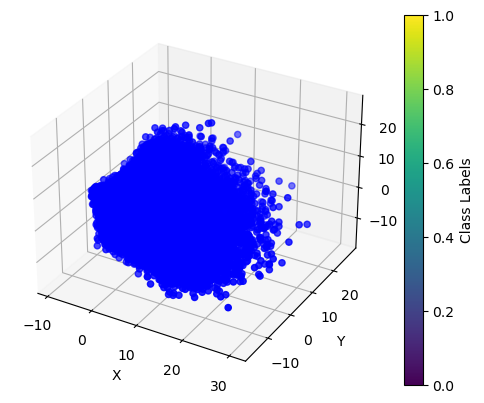

In [126]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming X_train_trf contains your 3D data and y_train_trf contains class labels
X_train_trf = X_train_trf.astype(float)  # Convert the data to float if it's not already

# Scatter plot with colors based on class labels
scatter = ax.scatter(X_train_trf[:, 0], X_train_trf[:, 1], X_train_trf[:, 2], c='blue', cmap='viridis')

# Add a color bar which maps values to colors
cbar = plt.colorbar(scatter)
cbar.set_label('Class Labels')

# Set labels for the axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Show the plot
plt.show()


In [121]:
pca.explained_variance_
#Set of Eigenvalues. We will get only 3 because we chose only 3 dimensions.

array([40.67111198, 29.17023394, 26.74459599])

In [122]:
pca.components_
#Set of Eigenvectors

array([[ 3.66005225e-17, -1.04170072e-18,  1.00892159e-19, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 8.71476761e-17, -2.39613561e-17,  7.95629341e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 5.25529700e-17, -9.75777560e-18,  5.83683617e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [123]:
pca.components_.shape

(3, 784)

There are 3 vectors. Each vector has 784 components. Now we will be using these vectors to transform all our points using fit transform.

Eigenvalues are denoted by $ \lambda $. 

We are applying PCA on 784 dimensional data, therefore we will have 784 $ \lambda $ values.

For example, $ \lambda_1 $ tells us how much variance of our original data is explained by it.

Now we will convert each $ \lambda $ to percentages. 

For example, ($ \lambda_1 $/($ \lambda_1 $ + $ \lambda_2 $ + $ \lambda_3 $ + ... $ \lambda_{784} $)) * 100

Usually, we want 90% of variance to be explained so take as many lambdas until we reach 90%


In [128]:
pca.explained_variance_ratio_ * 100

array([5.78519225, 4.14926967, 3.80423898])

In the code above, first eigenvector explains 5.78% variance of our original data and so on. These 3 eigenvectors cumulatively explains almost 12% of variance.

In [129]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [130]:
pca.components_.shape

(784, 784)

In [131]:
pca.explained_variance_ratio_ * 100

array([5.78519225e+00, 4.14926968e+00, 3.80423901e+00, 2.96626277e+00,
       2.58156168e+00, 2.25498018e+00, 1.97306802e+00, 1.77527998e+00,
       1.56865066e+00, 1.43606328e+00, 1.37025484e+00, 1.22725500e+00,
       1.14691200e+00, 1.12302739e+00, 1.05852885e+00, 1.01993106e+00,
       9.57676152e-01, 9.42708817e-01, 9.12489429e-01, 8.90170190e-01,
       8.39940495e-01, 8.20063196e-01, 7.85303229e-01, 7.56739707e-01,
       7.37261022e-01, 7.01884653e-01, 6.97919728e-01, 6.71104483e-01,
       6.39845030e-01, 6.30337291e-01, 6.15350848e-01, 6.02388659e-01,
       5.83673972e-01, 5.78547759e-01, 5.72333148e-01, 5.46399774e-01,
       5.43207369e-01, 5.28172755e-01, 5.13381744e-01, 4.94015474e-01,
       4.87671103e-01, 4.81978768e-01, 4.68204430e-01, 4.59342487e-01,
       4.57660834e-01, 4.49219022e-01, 4.44682221e-01, 4.41540749e-01,
       4.35111936e-01, 4.32032928e-01, 4.21808870e-01, 4.18243127e-01,
       4.07994349e-01, 4.02004913e-01, 3.98335855e-01, 3.94598812e-01,
      

In [132]:
#Cumulative sum
np.cumsum(pca.explained_variance_ratio_ * 100)

array([  5.78519225,   9.93446193,  13.73870094,  16.70496371,
        19.2865254 ,  21.54150558,  23.5145736 ,  25.28985357,
        26.85850424,  28.29456752,  29.66482235,  30.89207736,
        32.03898935,  33.16201674,  34.22054559,  35.24047664,
        36.1981528 ,  37.14086161,  38.05335104,  38.94352123,
        39.78346173,  40.60352492,  41.38882815,  42.14556786,
        42.88282888,  43.58471353,  44.28263326,  44.95373775,
        45.59358278,  46.22392007,  46.83927092,  47.44165957,
        48.02533355,  48.6038813 ,  49.17621445,  49.72261423,
        50.2658216 ,  50.79399435,  51.30737609,  51.80139157,
        52.28906267,  52.77104144,  53.23924587,  53.69858836,
        54.15624919,  54.60546821,  55.05015043,  55.49169118,
        55.92680312,  56.35883605,  56.78064492,  57.19888804,
        57.60688239,  58.00888731,  58.40722316,  58.80182197,
        59.18869358,  59.57188877,  59.94844139,  60.32263485,
        60.68748701,  61.04828955,  61.402176  ,  61.75

Text(0, 0.5, 'Explained variance percentage')

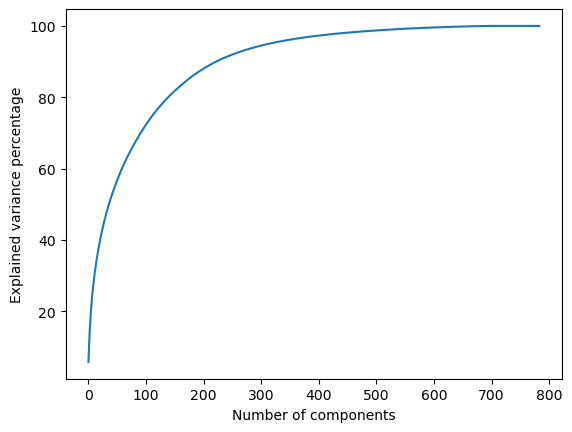

In [134]:
#Rather than manually counting that when 90 is achieved, we will just plot it.
plt.plot(np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel("Number of components")
plt.ylabel("Explained variance percentage")

At around 250 components, our 90% of variance is being explained.